In [1]:
import joblib
from tqdm import tqdm
import gc

import pandas as pd
import numpy as np

from optiver_trading_at_the_close.feature_engineering import FE
from optiver_trading_at_the_close.nearest_neightbors_features import NearestNeighborsFeatures
from optiver_trading_at_the_close.column_selector import ColumnSelector
from optiver_trading_at_the_close.memory_reduction import MemoryReduction
from optiver_trading_at_the_close.mean_regressor_ensemble import MeanRegressorEnsemble

from sklearn.metrics import mean_absolute_error

from sklearn.pipeline import Pipeline

## Hard Variables

In [2]:
DATA_PATH = './../data/train.csv'


MODEL_PATHS = [
    './../output/models/V11/lightgbm/lightgbm-1619294d-f04b-4e44-977d-79aa56b1b1ed.joblib',
]

## Read Data

In [3]:
df = pd.read_csv(DATA_PATH)

In [4]:
df.head()

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
0,0,0,0,3180602.69,1,0.999812,13380276.64,NaN,NaN,0.999812,60651.50,1.000026,8493.03,1.0,-3.029704,0,0_0_0
1,1,0,0,166603.91,-1,0.999896,1642214.25,NaN,NaN,0.999896,3233.04,1.000660,20605.09,1.0,-5.519986,0,0_0_1
2,2,0,0,302879.87,-1,0.999561,1819368.03,NaN,NaN,0.999403,37956.00,1.000298,18995.00,1.0,-8.389950,0,0_0_2
3,3,0,0,11917682.27,-1,1.000171,18389745.62,NaN,NaN,0.999999,2324.90,1.000214,479032.40,1.0,-4.010200,0,0_0_3
4,4,0,0,447549.96,-1,0.999532,17860614.95,NaN,NaN,0.999394,16485.54,1.000016,434.10,1.0,-7.349849,0,0_0_4


## Feature Engineering

In [5]:
# df = df.dropna(subset=['target'], axis=0)

# y = df['target']
# X = df.drop(columns='target')

# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)

In [6]:
df = df.dropna(subset=['target'], axis=0)

X_train = df.loc[df['date_id'] <= 420]
X_test = df.loc[df['date_id'] > 420]

y_train = X_train['target']
# X_train = X_train.drop(columns='target')

y_test = X_test['target']
# X_test = X_test.drop(columns='target')

In [7]:
X_train

,stock_id,date_id,seconds_in_bucket,imbalance_size,imbalance_buy_sell_flag,reference_price,matched_size,far_price,near_price,bid_price,bid_size,ask_price,ask_size,wap,target,time_id,row_id
0,0,0,0,3180602.69,1,0.999812,13380276.64,NaN,NaN,0.999812,60651.50,1.000026,8493.03,1.000000,-3.029704,0,0_0_0
1,1,0,0,166603.91,-1,0.999896,1642214.25,NaN,NaN,0.999896,3233.04,1.000660,20605.09,1.000000,-5.519986,0,0_0_1
2,2,0,0,302879.87,-1,0.999561,1819368.03,NaN,NaN,0.999403,37956.00,1.000298,18995.00,1.000000,-8.389950,0,0_0_2
3,3,0,0,11917682.27,-1,1.000171,18389745.62,NaN,NaN,0.999999,2324.90,1.000214,479032.40,1.000000,-4.010200,0,0_0_3
4,4,0,0,447549.96,-1,0.999532,17860614.95,NaN,NaN,0.999394,16485.54,1.000016,434.10,1.000000,-7.349849,0,0_0_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4577975,195,420,540,0.00,0,0.999083,38393322.85,0.999083,0.999083,0.999189,19941.61,0.999294,47260.00,0.999220,4.559755,23154,420_540_195
4577976,196,420,540,13016.13,-1,0.997619,6310893.81,0.997364,0.997619,0.997619,194266.96,0.997873,47441.16,0.997823,-0.349879,23154,420_540_196
4577977,197,420,540,943127.47,1,1.001847,18189807.60,1.002918,1.002918,1.001526,152096.04,1.001847,11134.83,1.001826,0.849962,23154,420_540_197
4577978,198,420,540,0.00,0,1.002033,90250234.53,1.002033,1.002033,1.001769,248213.92,1.002033,79180.78,1.001969,-2.930164,23154,420_540_198


In [8]:
del df 
gc.collect()

0

## Fit Model

In [9]:
estimators = [joblib.load(model_path) for model_path in MODEL_PATHS]

pipeline = Pipeline(steps=[
    ('fe', FE()),
    # ('nn_features', NearestNeighborsFeatures(
    #     features_to_use_for_distance_computation=['seconds_in_bucket', 'wap', 'bid_plus_ask_sizes', 'bid_ask_size_imb'],
    #     get_target=True,
    #     features_get=['wap', 'bid_ask_size_imb'],
    #     n_neighbors=[40],
    #     metrics=['l1'],
    #     n_jobs=-1
    # )),
    ('column_selector', ColumnSelector(cols_to_drop=['time_id', 'row_id', 'date_id', 'target'])),
    ('memore_reduction', MemoryReduction()),
    ('mean_regressor_ensemble', MeanRegressorEnsemble(estimators))
])

# pipeline.fit(X_train, y_train, mean_regressor_ensemble__fit_estimators=False)
pipeline.fit(X_train, y_train)

100%|██████████| 1/1 [1:04:31<00:00, 3871.55s/it]


Pipeline(steps=[('fe', FE()),
                ('column_selector',
                 ColumnSelector(cols_to_drop=['time_id', 'row_id', 'date_id',
                                              'target'])),
                ('memore_reduction', MemoryReduction()),
                ('mean_regressor_ensemble',
                 MeanRegressorEnsemble(estimators=[LGBMRegressor(colsample_bytree=0.6,
                                                                 learning_rate=0.015,
                                                                 max_bin=256,
                                                                 max_depth=12,
                                                                 min_child_samples=128,
                                                                 n_estimators=1400,
                                                                 num_leaves=300,
                                                                 objective='mae',
                                                                 reg_alpha=0.005,
                                                                 reg_lambda=0.001,
                                                                 subsample=0.875,
                                                                 verbose=-1)],
                                       weights=array([1.])))])

## Weights Tunning

### Get each model predictions

In [10]:
def get_each_model_predictions(pipeline, X):
    _X = X.copy()

    for step in pipeline.steps[:-1]:
        _X = step[1].transform(_X)
        
    preds = [estimator.predict(_X, nn_features__exclude_self=False) for estimator in pipeline.steps[-1][1].estimators]
    
    return preds

preds = get_each_model_predictions(pipeline, X_test)

### Tunning

In [11]:
def get_all_possible_weights(n, grid=np.arange(0, 1.01, 0.01)):
    grid = grid
    results = []
    
    def find_combinations(target_sum, current_combination, start_index):
        if target_sum == 0 and len(current_combination) == n:
            results.append(current_combination)
            return
        if target_sum < 0 or len(current_combination) == n:
            return
        for i in range(start_index, len(grid)):
            new_combination = current_combination + [grid[i]]
            find_combinations(target_sum - grid[i], new_combination, i)

    find_combinations(1, [], 0)
    
    return results


weights = get_all_possible_weights(len(preds))

In [12]:
def zero_sum(listOfPrices, listOfVolumes):
    """
    Source - https://www.kaggle.com/code/kaito510/goto-conversion-optiver-baseline-models
    """
    
    #compute standard errors assuming standard deviation is same for all stocks
    listOfSe = np.sqrt(listOfVolumes)
    step = sum(listOfPrices)/sum(listOfSe)
    outputListOfPrices = listOfPrices - listOfSe*step
    return outputListOfPrices

In [13]:
y_min = np.min(y_train)
y_max = np.max(y_train)

results = dict()

for weight in tqdm(weights):
    pred = np.average(preds, axis=0, weights=weight)
    pred = zero_sum(pred, X_test.loc[:,'bid_size'] + X_test.loc[:,'ask_size'])
    pred = np.clip(pred, y_min, y_max)
    
    results[tuple(weight)] = mean_absolute_error(y_test, pred)
    
results = sorted(results.items(), key=lambda x:x[1])
results # 5.675255703280886 -> kaggle, 5.675255703280886

100%|██████████| 1/1 [00:00<00:00, 10.64it/s]


[((1.0,), 5.676075475444788)]

In [14]:
train_pred = pipeline.predict(X_train)

# train_pred = zero_sum(train_pred, X_train.loc[:,'bid_size'] + X_train.loc[:,'ask_size'])
# train_pred = np.clip(train_pred, y_min, y_max)

test_pred = pipeline.predict(X_test)

# test_pred = zero_sum(test_pred, X_test.loc[:,'bid_size'] + X_test.loc[:,'ask_size'])
# test_pred = np.clip(test_pred, y_min, y_max)

print(f'Train = {mean_absolute_error(y_train, train_pred):.3f}')
print(f'Test = {mean_absolute_error(y_test, test_pred):.3f}')

# Train = 5.990
# Test = 5.675

Train = 5.994
Test = 5.676


<Axes: xlabel='damped_mean'>

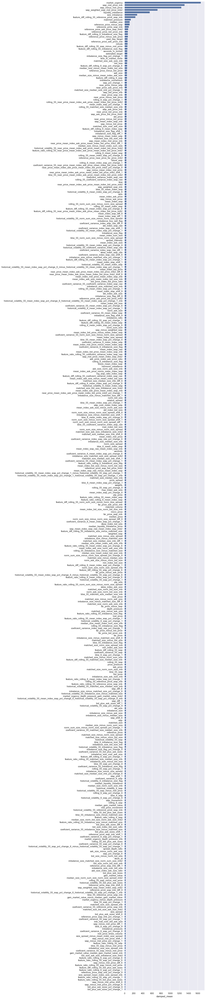

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()


def get_booster_importance_damped_mean(lightgbm, damping_factor=10):
    booster = lightgbm.booster_
    
    results = pd.DataFrame(
        {
            'gain':booster.feature_importance(importance_type='gain'),
            'split':booster.feature_importance(importance_type='split')
        },
        index = booster.feature_name()
    )
    
    results['simple_mean'] = results['gain'] / results['split']
    
    global_mean = results['gain'].sum() / results['split'].sum()
    damped_numerator = results['gain'] + damping_factor * global_mean
    damped_denominator = results['split'] + damping_factor
    results['damped_mean'] = damped_numerator/damped_denominator
    
    results.loc[results['split']==0, 'damped_mean'] = 0
    
    return results.sort_values(by='damped_mean', ascending=False)

aa = get_booster_importance_damped_mean(pipeline['mean_regressor_ensemble'].estimators[0])

fig, ax = plt.subplots(1, 1, figsize=(7, 87))

sns.barplot(
    aa['damped_mean'],
    orient="y",
    ax=ax
)

<Axes: xlabel='average_importance'>

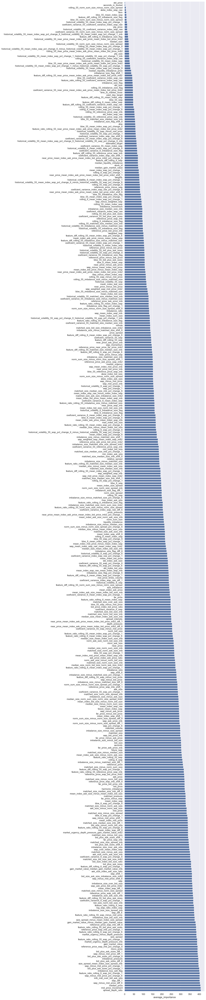

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

def get_booster_importance(lightgbm):
    importance_types = ['gain', 'split']
    
    booster = lightgbm.booster_
    
    results = pd.DataFrame(index=booster.feature_name())
    
    for importance_type in importance_types:
        importance_type_order = pd.DataFrame(
            {importance_type:booster.feature_importance(importance_type=importance_type)},
            index = booster.feature_name()
        )

        importance_type_order = importance_type_order.sort_values(by=importance_type, ascending=False)
        importance_type_order[f'{importance_type}_importance'] = np.arange(1, importance_type_order.shape[0]+1)
        importance_type_order.loc[importance_type_order[importance_type]==0, f'{importance_type}_importance'] = importance_type_order.shape[0]+1000
        
        results.loc[results.index, f'{importance_type}_importance'] = importance_type_order.loc[results.index, f'{importance_type}_importance']
        
    results['average_importance'] = results.mean(axis=1)
    
    return results.sort_values(by='average_importance', ascending=True)

aa = get_booster_importance(pipeline['mean_regressor_ensemble'].estimators[0])

fig, ax = plt.subplots(1, 1, figsize=(7, 87))

sns.barplot(
    aa['average_importance'],
    orient="y",
    ax=ax
)

In [17]:
pd.set_option('display.max_rows', 700)

aa['average_importance']

std_price                                                                                                            3.0
seconds_in_bucket                                                                                                    4.0
rolling_55_norm_sum_size_minus_norm_size_spread                                                                      6.5
skew_index_wap_raw                                                                                                   8.0
dom                                                                                                                  9.0
bbw_55_mean_index_wap                                                                                               10.0
feature_diff_rolling_55_imbalance_size_flag                                                                         10.5
bbw_55_norm_sum_size_minus_norm_size_spread                                                                         11.0
historical_volatility_55_mean_in

<Axes: title={'center': 'LightGBM Feature Importance (Gain)'}, xlabel='Feature importance', ylabel='Features'>

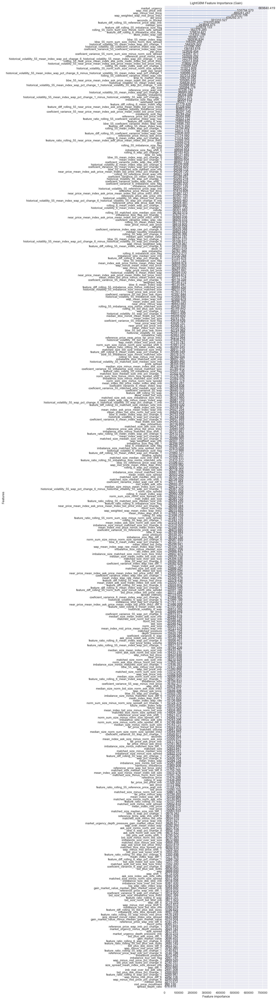

In [18]:
import lightgbm as lgb
import seaborn as sns
sns.set()

lgb.plot_importance(
    pipeline['mean_regressor_ensemble'].estimators[0],
    importance_type="gain",
    figsize=(7,67),
    title="LightGBM Feature Importance (Gain)",
)

<Axes: title={'center': 'LightGBM Feature Importance (Gain)'}, xlabel='Feature importance', ylabel='Features'>

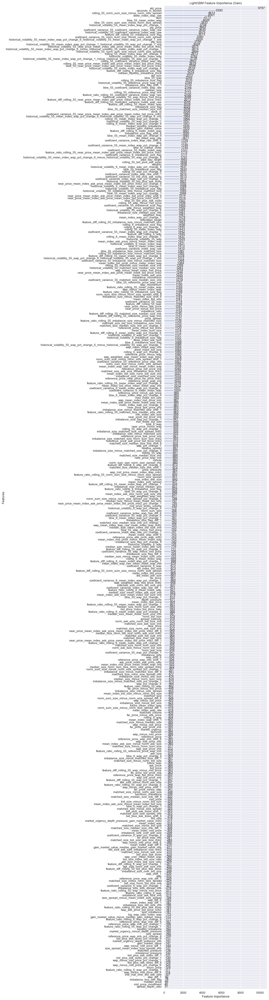

In [19]:
import lightgbm as lgb
import seaborn as sns
sns.set()

lgb.plot_importance(
    pipeline['mean_regressor_ensemble'].estimators[0],
    importance_type="split",
    figsize=(7,67),
    title="LightGBM Feature Importance (Gain)",
)